In [1]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder
from datetime import datetime, timedelta

In [6]:
df = pd.read_csv('new.csv')
df.drop(['stop', 'Service', 'Unnamed: 0', 'totality', 'in', 'out', 'ConNo'], 1 , inplace=True)
#df = df.drop(df[(df['td']>0) & (df['Charge']>250)].index).reset_index(drop=True)

C:\Users\aymze\AppData\Local\Temp\ipykernel_10268\2070327818.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop(['stop', 'Service', 'Unnamed: 0', 'totality', 'in', 'out', 'ConNo'], 1 , inplace=True)


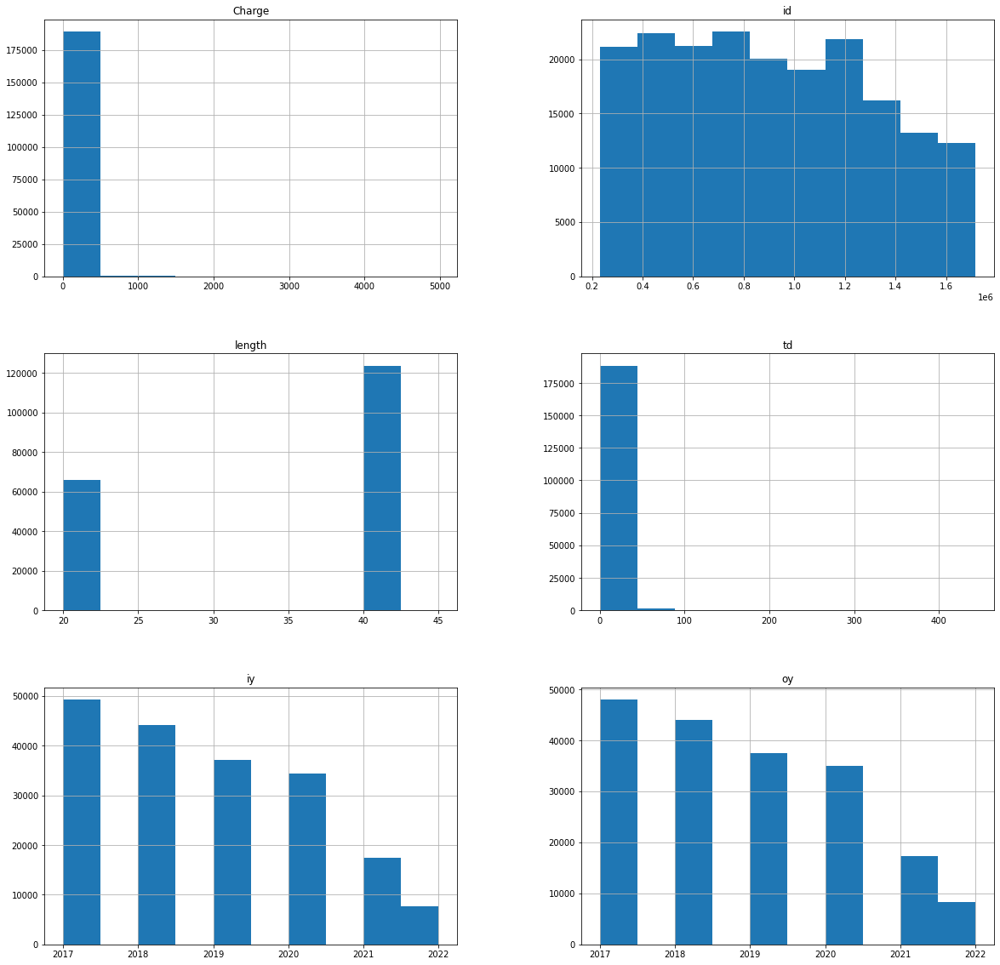

In [7]:
df.hist(figsize=(20,20))
plt.show()

In [4]:
# Get list of categorical variables
s = (df.dtypes == 'object')
object_cols = list(s[s].index)

print("Categorical variables:")
print(object_cols)

ordinal_encoder = OrdinalEncoder()
df[object_cols] = ordinal_encoder.fit_transform(df[object_cols])

Categorical variables:
['LineOp', 'code', 'type']


In [5]:
corrPearson = df.corr(method="pearson")
corrSpearman = df.corr(method="spearman")

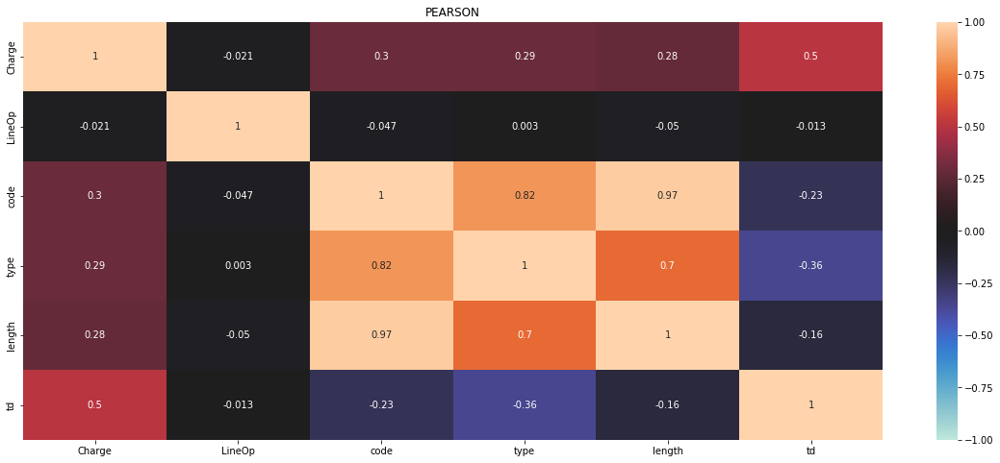

In [6]:
figure = plt.figure(figsize=(20,8))
sns.heatmap(corrPearson,annot=True,vmin=-1,center=0,vmax=1)
plt.title("PEARSON")
plt.show()

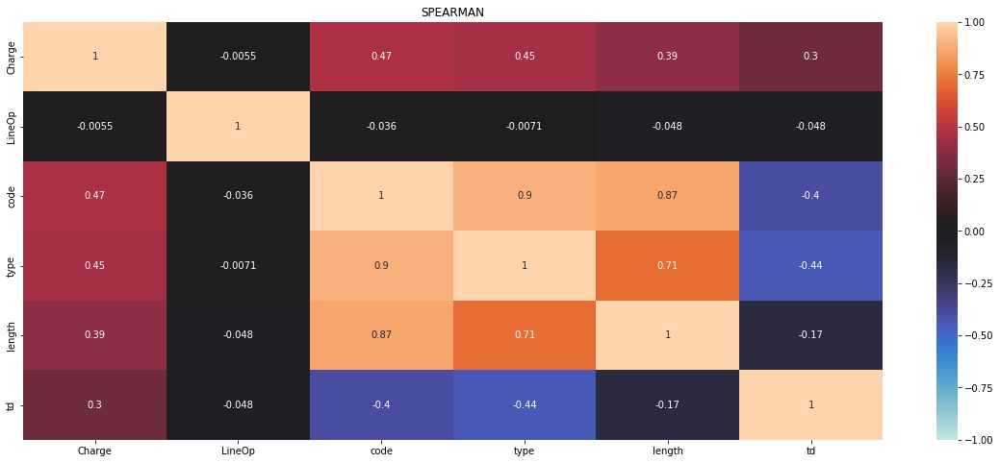

In [7]:
figure = plt.figure(figsize=(20,8))
sns.heatmap(corrSpearman,annot=True,vmin=-1,center=0,vmax=1)
plt.title("SPEARMAN")
plt.show()

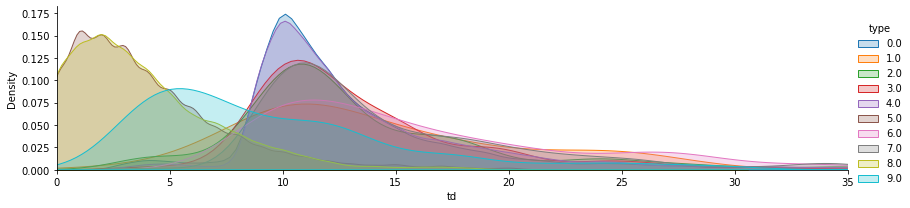

In [8]:
#plot distributions of age of passengers who survived or did not survive
a = sns.FacetGrid( df, hue = 'type', aspect=4 )
a.map(sns.kdeplot, 'td', shade= True )
a.set(xlim=(0 , 35))
a.add_legend()

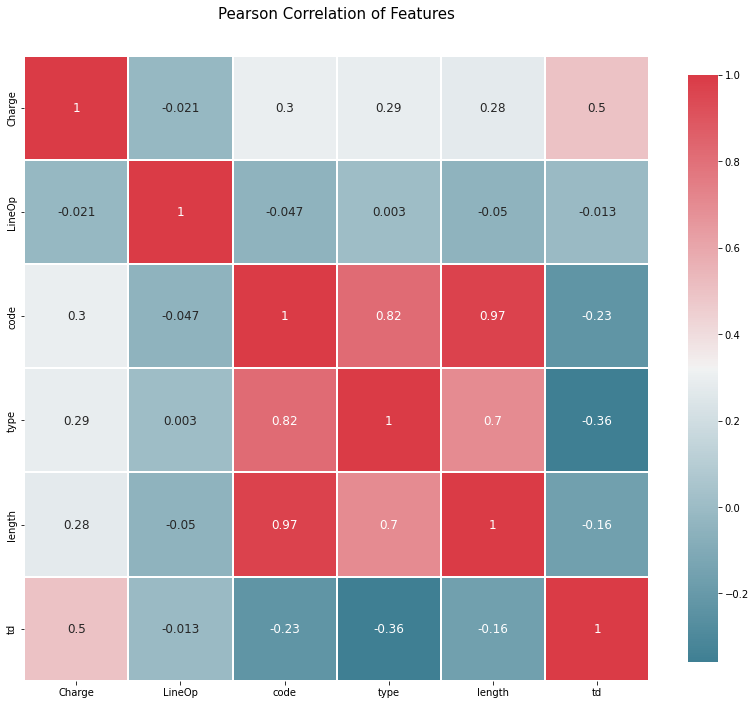

In [9]:
#correlation heatmap of dataset
def correlation_heatmap(df):
    _ , ax = plt.subplots(figsize =(14, 12))
    colormap = sns.diverging_palette(220, 10, as_cmap = True)
    
    _ = sns.heatmap(
        df.corr(), 
        cmap = colormap,
        square=True, 
        cbar_kws={'shrink':.9 }, 
        ax=ax,
        annot=True, 
        linewidths=0.1,vmax=1.0, linecolor='white',
        annot_kws={'fontsize':12 }
    )
    
    plt.title('Pearson Correlation of Features', y=1.05, size=15)

correlation_heatmap(df)

In [10]:
covv = df.cov()

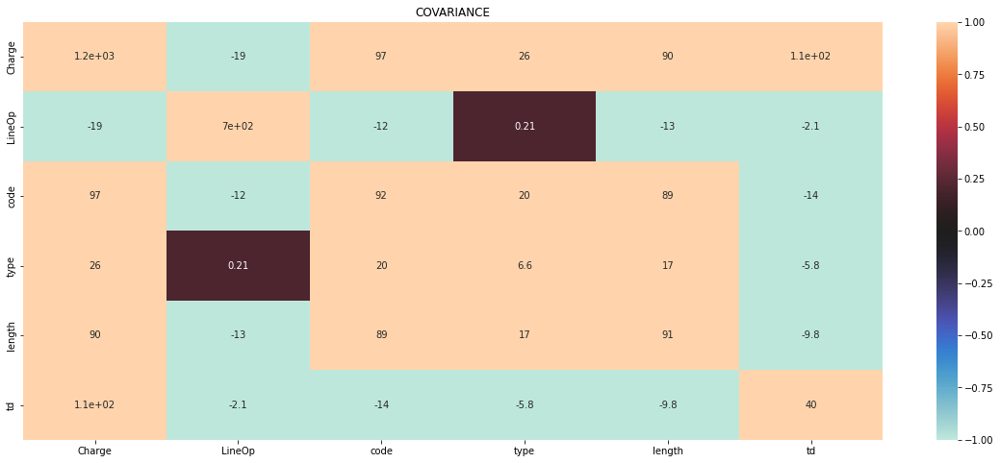

In [11]:
figure = plt.figure(figsize=(20,8))
sns.heatmap(covv,annot=True,vmin=-1,center=0,vmax=1)
plt.title("COVARIANCE")
plt.show()

In [12]:
covv = df.cov()

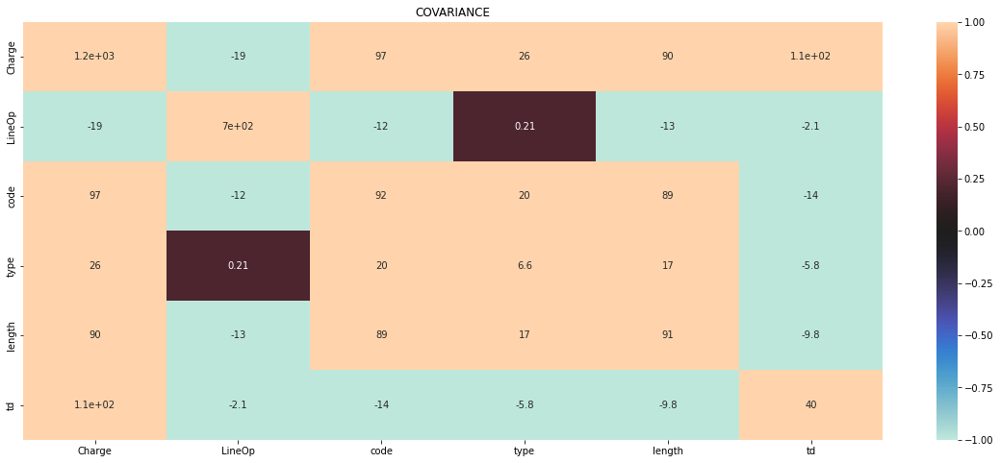

In [13]:
figure = plt.figure(figsize=(20,8))
sns.heatmap(covv,annot=True,vmin=-1,center=0,vmax=1)
plt.title("COVARIANCE")
plt.show()

In [14]:
from numpy.random import seed
from numpy.random import randn
from statsmodels.graphics.gofplots import qqplot
from matplotlib import pyplot

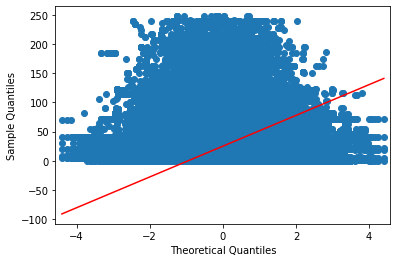

In [15]:
#df_new = df[['Charge', 'td']]
qqplot(df, line='s')
pyplot.show()

In [16]:
dfn = df.copy()
dfn = dfn.drop(dfn[(dfn['td']>0) & (dfn['Charge']>50)].index).reset_index(drop=True)

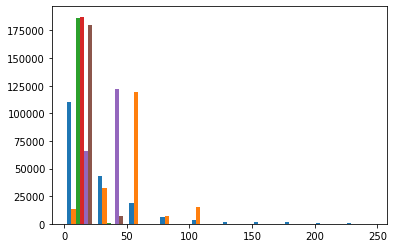

In [17]:
pyplot.hist(df)
pyplot.show()

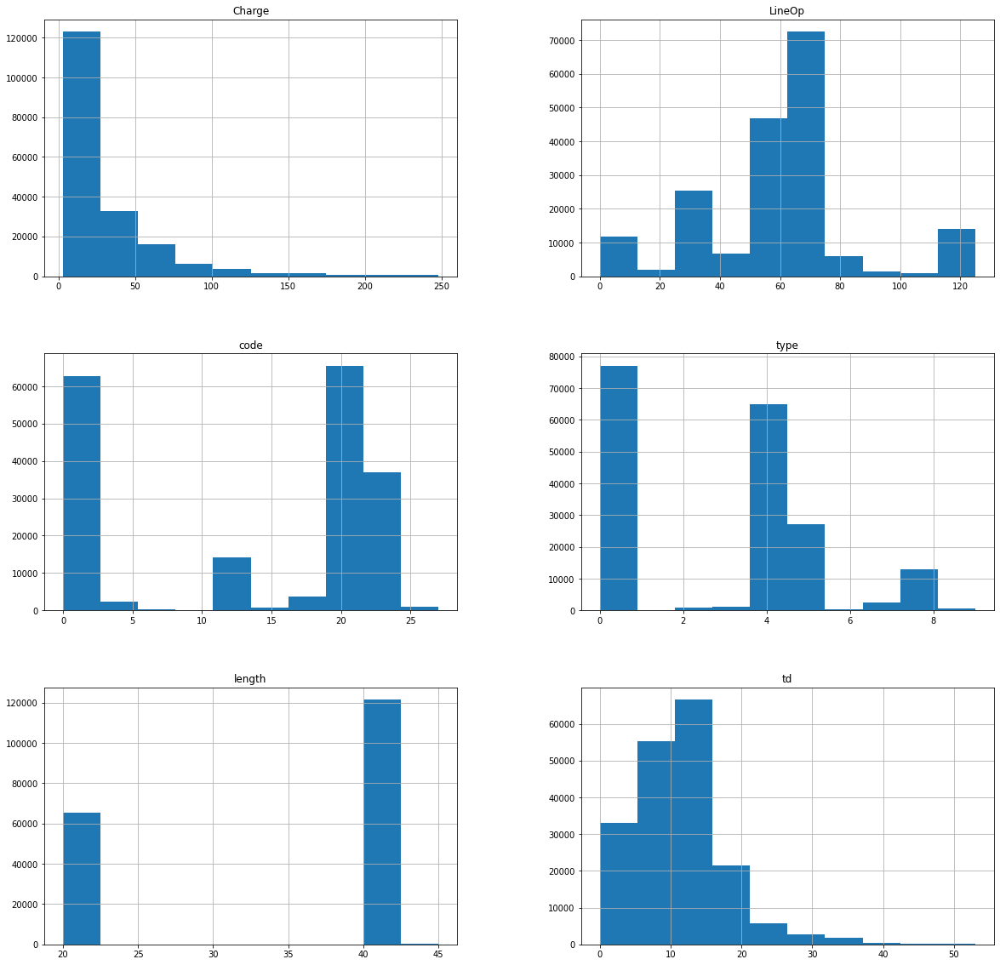

In [18]:
df.hist(figsize=(20,20))
plt.show()

In [19]:
i=0
for ex in df['in']:
    if type(ex) == float:
        df.drop(i, axis=0, inplace=True)
        
    i=i+1

KeyError: 'in'

In [27]:


#dfn = dfn.drop(dfn[(dfn['td']>250) & (dfn['Charge']>2500)].index).reset_index(drop=True)
#dfn = dfn.drop(dfn[(dfn['td']>250) & (dfn['Charge']>2500)].index).reset_index(drop=True)


fig = px.scatter(df, x="td", y="Charge", color='type', hover_data=['id', 'iy', ])
fig.show()